# Data Visualization

## Introduction

This presentation will analyze the crime distribution in Houston area. 
As I am a Rice student, I will analysis the crime distribution around Rice, which will also provide insight on renting apartment off campus in the future. 

**Data Source**

The dataset is found on https://www.kinderudp.org/#/datasetCatalog. It is a data source open to Rice student. The data is provided by the Houston Police Department. 

**Data Variables**

In [ ]:
Variable|Type|Length|Description
Block_Range|Char|23|Block Range of Street where crime occurred
CTA_ID|Char|4|Community Tabulation Area (ID)
CTA_Name|Char|50|Community Tabulation Area (Nam
Date_Reported|Date|mm/dd/yyyy|Date Offense Was Reported
GEOID00|Char|15|Census Block (2000)
GEOID10|Char|15|Census Block (2010)
Geocoded|Yes|No|1|GeoCoded (1=yes)
Hour|Num|8|Hour
Location_Code|Char|3|Location of Offense (Code)
Location_Desc|Char|85|Location of Offense (Description)
Match_addr|Char|120|Matched Address for Geocoding
NGC|Yes|No|1|Not Geocodable (1=yes)
Num_Offenses|Num|8|Number of Offenses
Offense_Type|Char|18|Offense Type (UCR Part 1 Crime Classification)
Police_Beat|Char|6|Police Neighborhood & District (Police Beat)
Police_Division|Char|80|Police Beat Division
RecordID|Num|8|Unique Record ID 
Srce_YYMM|Char|7|Source File Year/Month
Street_Name|Char|60|Street Name where crime occurred
Street_Prefix|Char|1|Street Prefix
Street_Type|Char|7|Street Type
X|Num|8|X Coordinate (GCS_WGS_1984)
Y|Num|8|Y Coordinate (GCS_WGS_1984)

## Read Data

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import folium
%matplotlib inline

In [2]:
# Read data
crime = pd.read_csv("crime data/Curated/HPD_Crime_2009_2017_v01.csv")

## Clean Data

**Drop Duplicates**

In [3]:
# Find duplicate and drop duplicates
crime[crime.duplicated()].shape

(0, 23)

There is no duplicate variable.

In [4]:
# crime = crime.drop_duplicates()

In [5]:
crime.head()

,Location_Desc,Police_Beat,Street_Type,RecordID,Date_Reported,Offense_Type,Block_Range,Street_Prefix,Street_Name,Num_Offenses,...,X,Y,GEOID10,GEOID00,Police_Division,CTA_ID,CTA_Name,Geocoded,Location_Code,Hour
0,NaN,14D40,RD,1,NaN,Burglary,5600-5699,NaN,SELINSKY,1,...,-95.333268,29.637514,4.820133e+14,4.820133e+14,Southeast Division,K066,Minnetex,1,NaN,8
1,NaN,7C20,NaN,2,NaN,Theft,3900-3999,NaN,CAVALCADE,1,...,-95.331799,29.800081,4.820121e+14,4.820121e+14,Northeast Division,K004,Kashmere Gardens,1,NaN,11
2,NaN,13D40,PKWY,3,NaN,Theft,8500-8599,S,SAM HOUSTON,1,...,-95.516291,29.625560,4.820133e+14,4.820133e+14,Southwest Division,K070,Five Corners,1,NaN,15
3,NaN,18F40,RD,4,NaN,Robbery,2700-2799,NaN,DUNVALE,1,...,-95.514200,29.736820,4.820143e+14,4.820143e+14,Midwest Division,K080,Mid-West,1,NaN,14
4,RESTAURANT/CAFETERIA,24C60,PKWY,5,09/08/1914,Burglary,12700-12799,W,LAKE HOUSTON,1,...,-95.195466,29.924672,4.820125e+14,4.820125e+14,Kingwood Division,K106,Lake Houston,1,210,7


**Drop Useless Data**

In [6]:
# Drop unused columns
crime = crime.drop(['Street_Prefix','Police_Beat','GEOID10','GEOID00','Geocoded','NGC','CTA_ID','CTA_Name', 'Srce_YYMM'], axis=1)

As we are analyzing the crime type and year, we need to drop the null value in offense Type.

In [7]:
crime.Offense_Type.unique()

array(['Burglary', 'Theft', 'Robbery', 'Auto Theft', 'Rape',
       'Aggravated Assault', 'Murder', '1'], dtype=object)

In [8]:
# Drop some data in which there is no Offense Type
crime = crime.drop(crime.loc[crime['Offense_Type'] == '1'].index)

In [9]:
crime.Offense_Type.value_counts()

Theft                 600981
Burglary              200450
Auto Theft            109185
Aggravated Assault     90075
Robbery                83792
Rape                    7622
Murder                  2088
Name: Offense_Type, dtype: int64

In [10]:
crime.shape

(1094193, 14)

Drop the missing value where has no X or Y coordinates or Date_Reported

In [11]:
crime["X"] = crime.X.fillna(0)

In [12]:
crime["Y"] = crime.Y.fillna(0)

In [13]:
crime["Date_Reported"] = crime.Date_Reported.fillna(0)

In [14]:
crime = crime.drop(crime.loc[crime['X'] == 0.000000].index)

In [15]:
crime = crime.drop(crime.loc[crime['Y'] == 0.000000].index)

Extarct from the date time and add a 'year' column

In [16]:
crime['year'] = pd.to_datetime(crime.Date_Reported).dt.year

In [17]:
# Store the data and generate a new dataframe
crime.to_pickle("crime data/new_crime.pkl")

In [18]:
crime.to_csv("crime data/new_crime.csv", index=False)

Use a dataframe with smaller size in which the year starts after 2010

In [19]:
crime_af_2010 = crime[crime.year > 2010]

In [20]:
# Store the data
crime_af_2010.to_csv("crime data/crime_af_2010.csv", index=False)

Store and read from the new dataframe

In [24]:
df = pd.read_csv("crime data/crime_af_2010.csv")

In [25]:
# Add a new column with year and month
df['year_month'] = pd.to_datetime(df.Date_Reported).apply(lambda x: x.strftime('%Y-%m'))

In [26]:
# Add a new column with the coordinates
df['location'] = list(zip(df.X, df.Y))

In [27]:
df.head()

,Location_Desc,Street_Type,RecordID,Date_Reported,Offense_Type,Block_Range,Street_Name,Num_Offenses,Match_addr,X,Y,Police_Division,Location_Code,Hour,year,year_month,location
0,RESIDENCE/HOUSE,DR,226673,01/01/2011,Burglary,5000-5099,YARWELL,1,"5050 Yarwell Dr, Houston, Texas, 77096",-95.468160,29.671262,Southwest Division,20R,0,2011,2011-01,"(-95.46816, 29.671262)"
1,APARTMENT,DR,226674,01/01/2011,Murder,9400-9499,COVENTRY SQUARE,1,"9450 Coventry Square Dr, Houston, Texas, 77099",-95.594038,29.677108,Westside Division,20A,6,2011,2011-01,"(-95.594038, 29.677108)"
2,APARTMENT,LN,226675,01/01/2011,Rape,7200-7299,PATRICIA,1,"7250 Patricia Ln, Houston, Texas, 77012",-95.288599,29.704569,Eastside Division,20A,7,2011,2011-01,"(-95.288599, 29.704569)"
3,BANK/SAVING INSTITUTION PARKING LOT,DR,226676,01/01/2011,Robbery,8300-8399,GESSNER,1,"8350 S Gessner Dr, Houston, Texas, 77036",-95.531166,29.688189,Midwest Division,18B,4,2011,2011-01,"(-95.531166, 29.688189)"
4,APARTMENT PARKING LOT,DR,226677,01/01/2011,Robbery,9800-9899,CLUB CREEK,1,"9850 Club Creek Dr, Houston, Texas, 77036",-95.550145,29.681045,Westside Division,18A,20,2011,2011-01,"(-95.550145, 29.681045)"


**Observe Outliers**

In [28]:
from scipy import stats
import numpy as np

def outliers_col(df):
    for column in df:
        if df[column].dtype != np.object:
            n_outliers = len(df[np.abs(stats.zscore(df[column])) > 3])    
            print("{} | {} | {}".format(
                df[column].name,
                n_outliers,
                df[column].dtype
        ))

outliers_col(df)

RecordID | 0 | int64
Num_Offenses | 10940 | int64
X | 6 | float64
Y | 7762 | float64
Hour | 0 | int64
year | 4 | int64


As X and y are coordinates, they can allow some variance, but there is year outliers so we can drop those outliers. 

In [29]:
df.year.unique()

array([2011, 2012, 2013, 2014, 2015, 2019, 2020, 2021, 2029, 2033, 2016,
       2017])

In [30]:
df = df[df.year <= 2017]

**Observe missing values**

In [31]:
n_records = len(df)
def missing_values_col(df):
    for column in df:
        print("{} | {} | {}".format(
            column, len(df[df[column].isnull()]) / (1.0*n_records), df[column].dtype
        ))

missing_values_col(df)

Location_Desc | 0.0413217627473987 | object
Street_Type | 0.23596371584959827 | object
RecordID | 0.0 | int64
Date_Reported | 0.0 | object
Offense_Type | 0.0 | object
Block_Range | 4.407464100013699e-05 | object
Street_Name | 0.0 | object
Num_Offenses | 0.0 | int64
Match_addr | 0.0 | object
X | 0.0 | float64
Y | 0.0 | float64
Police_Division | 0.011312888258873 | object
Location_Code | 0.041390852725182704 | object
Hour | 0.0 | int64
year | 0.0 | int64
year_month | 0.0 | object
location | 0.0 | object


There are not too many null values, except for the type columns. We can fill in those values or drop them when frawing graphs.

In [32]:
df["Street_Type"]=df.Street_Type.fillna("no type")

In [33]:
df["Police_Division"]=df.Police_Division.fillna("no division")

In [34]:
# df.set_index('RecordID').head()

In [35]:
df.dtypes

Location_Desc       object
Street_Type         object
RecordID             int64
Date_Reported       object
Offense_Type        object
Block_Range         object
Street_Name         object
Num_Offenses         int64
Match_addr          object
X                  float64
Y                  float64
Police_Division     object
Location_Code       object
Hour                 int64
year                 int64
year_month          object
location            object
dtype: object

## Data Analysis

In [36]:
from ipywidgets import interact, fixed

**Change some columns' type to category**

In [37]:
df.Street_Type = df.Street_Type.astype("category")

In [38]:
df.Offense_Type = df.Offense_Type.astype("category")

In [39]:
df.Police_Division = df.Police_Division.astype("category")

In [40]:
df.Location_Code = df.Location_Code.astype("category")

In [41]:
df.dtypes

Location_Desc        object
Street_Type        category
RecordID              int64
Date_Reported        object
Offense_Type       category
Block_Range          object
Street_Name          object
Num_Offenses          int64
Match_addr           object
X                   float64
Y                   float64
Police_Division    category
Location_Code      category
Hour                  int64
year                  int64
year_month           object
location             object
dtype: object

In [42]:
df.Offense_Type.value_counts(normalize=True)

Theft                 0.548783
Burglary              0.180139
Auto Theft            0.101910
Aggravated Assault    0.082813
Robbery               0.077500
Rape                  0.006971
Murder                0.001884
Name: Offense_Type, dtype: float64

In [43]:
# Store the variables 
df.to_csv("crime data/new_crime_af_2010.csv", index=False)

In [41]:
# df = pd.read_csv("crime data/new_crime_af_2010.csv")

**Plot**

In [46]:
import seaborn as sns

In [47]:
plt.rcParams["figure.figsize"] = (10, 10)

_**Plot the categorical variable counts**_

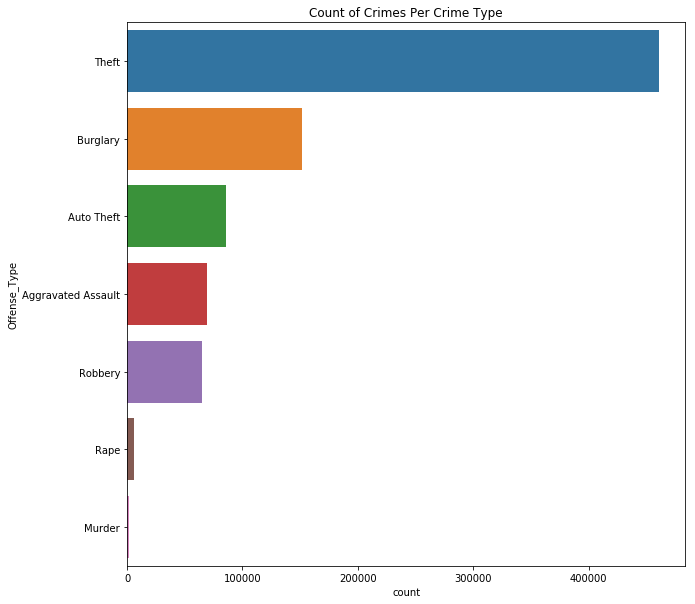

In [48]:
plt.title("Count of Crimes Per Crime Type")
sns.countplot(y= 'Offense_Type', data = df, order = df['Offense_Type'].value_counts().iloc[:10].index)

_**Plot the categorical variable distribution**_

In [49]:
def categorical_variable_distribution(col):
    df[col].value_counts(ascending=True,normalize=True).tail(20).plot.barh()
    plt.show()

In [50]:
categorical_columns = df.select_dtypes(
    ['category']).columns.tolist()

In [51]:
interact(categorical_variable_distribution, col=categorical_columns);

interactive(children=(Dropdown(description='col', options=('Street_Type', 'Offense_Type', 'Police_Division', '…

**Observation**

Theft happens the most, and the other top crimes are burgarly and auto theft, which are also type of crimes. 
Driving road, street and road happens the most crimes.
The western, northern and central police department deal with the most cases. 
The location code around 20 and 18 are the places where crime happens the most. 

_**Plot the Offense Type in accordance with year**_

In [52]:
df.groupby(['year','Offense_Type'])['year','Offense_Type'].head()

,year,Offense_Type
0,2011,Burglary
1,2011,Murder
2,2011,Rape
3,2011,Robbery
4,2011,Robbery
5,2011,Robbery
6,2011,Robbery
7,2011,Robbery
26,2011,Aggravated Assault
27,2011,Aggravated Assault


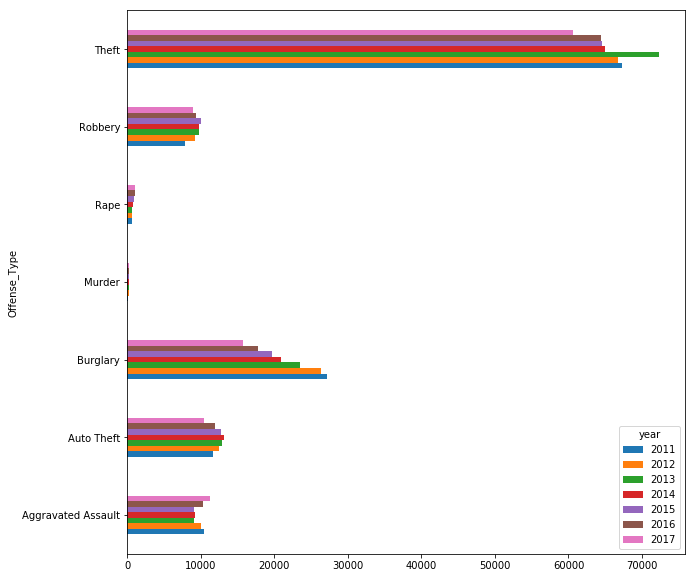

In [53]:
df.groupby('year').Offense_Type.value_counts().unstack(0).plot.barh()

_**Plot the trend of the Number of Offense with year and Offense Type**_

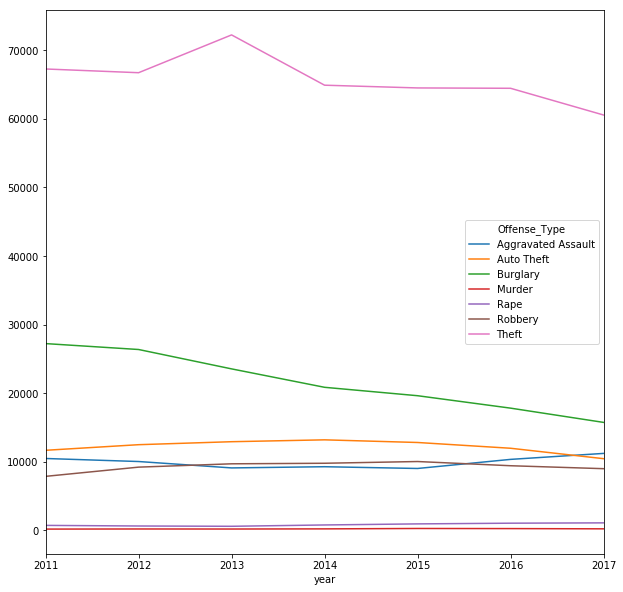

In [54]:
df.groupby(['year','Offense_Type']).count()['Num_Offenses'].unstack().plot()

**Observation**

Over the year, the crime rates decreases, especially in burglary. For the number of offenses, while theft rate increases in 2013, the overall trend decreases. 

_**Plot the trend of numerical variable with year**_

In [55]:
numerical_variables = df[['Hour','Num_Offenses','X','Y']].columns
categorical_variables = df.select_dtypes(include=['category']).columns

In [56]:
def mean_trend(col_calc):
    df.groupby('year')[col_calc].mean().plot()
    plt.ylabel(col_calc)
    plt.title("{} evolution over time".format(col_calc))
    plt.show()

In [57]:
interact(mean_trend, col_calc=numerical_variables);

interactive(children=(Dropdown(description='col_calc', options=('Hour', 'Num_Offenses', 'X', 'Y'), value='Hour…

**Plot the trend of categorical variables with year**

In [58]:
def count_trend(col_calc):
    for category in df[col_calc].unique():
        crime_category_year = df[df[col_calc]==category].groupby(
            'year').apply(np.size)
        try:
            plt.plot(
                crime_category_year.index,
                crime_category_year,
                label=category
            )
        except ZeroDivisionError:
            pass
        plt.legend()

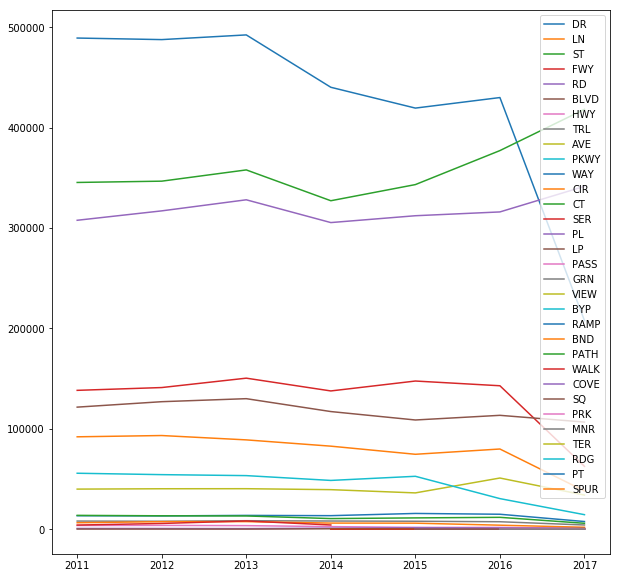

In [59]:
count_trend("Street_Type")

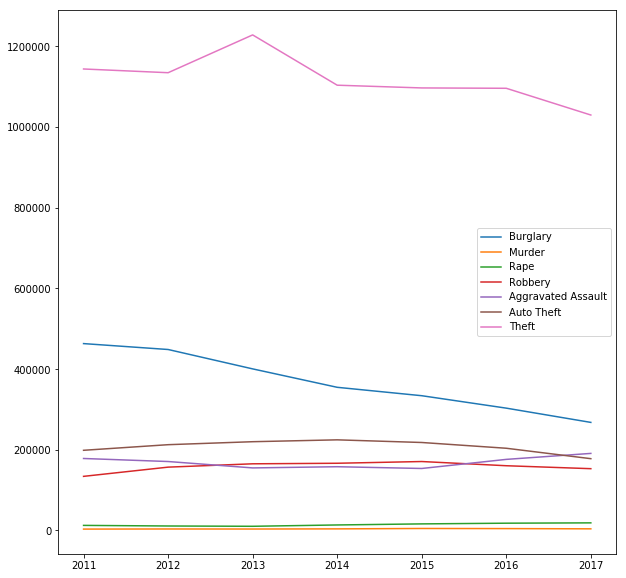

In [60]:
count_trend("Offense_Type")

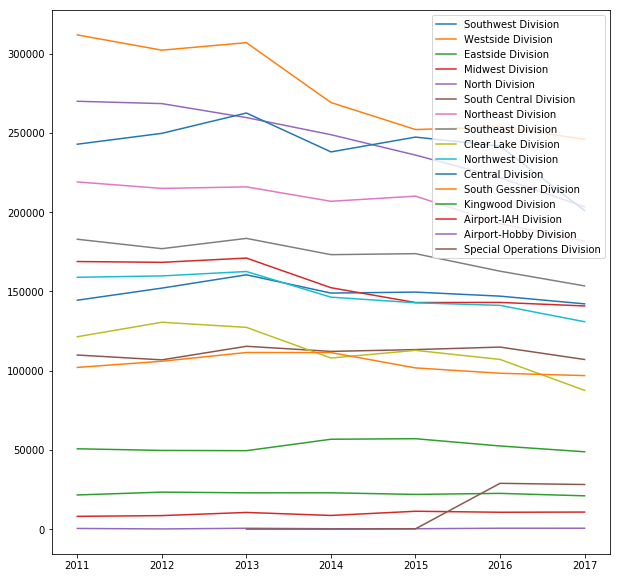

In [61]:
count_trend("Police_Division")

**Observation**

Over the year trend, crime decreases in general. The case dealing hour decreases, the cases the largest police division deal decreases. While the crimes happen on street and road increases, the driving road decreases sharply, along with other major types. 

**Theft**

As Theft is the most freqent crime, we take a closer look in theft between 2011 and 2017. 

In [62]:
theft_af_2010 = df[df.Offense_Type == 'Theft']

In [63]:
theft_af_2010.head()

,Location_Desc,Street_Type,RecordID,Date_Reported,Offense_Type,Block_Range,Street_Name,Num_Offenses,Match_addr,X,Y,Police_Division,Location_Code,Hour,year,year_month,location
174,APARTMENT,DR,226850,01/01/2011,Theft,9200-9299,WOODFAIR,1,"9250 Woodfair Dr, Houston, Texas, 77036",-95.551598,29.680917,Westside Division,20A,22,2011,2011-01,"(-95.551598, 29.680917)"
175,DEPARTMENT/DISCOUNT STORE,FWY,226851,01/01/2011,Theft,9500-9599,SOUTHWEST,1,"9550 Southwest Fwy, Houston, Texas, 77074",-95.541500,29.676857,Westside Division,080,12,2011,2011-01,"(-95.5415, 29.676857)"
176,RENTAL STORAGE FACILITY,ST,226852,01/01/2011,Theft,12200-12299,BEECHNUT,1,"12250 Beechnut St, Houston, Texas, 77072",-95.594562,29.689180,Westside Division,190,18,2011,2011-01,"(-95.594562, 29.68918)"
177,BAR/NIGHT CLUB,LN,226853,01/01/2011,Theft,100-199,POST OAK,1,"150 N Post Oak Ln, Houston, Texas, 77024",-95.457482,29.768857,Midwest Division,03B,0,2011,2011-01,"(-95.457482, 29.768857)"
178,RESIDENCE/HOUSE,NaN,226854,01/01/2011,Theft,11700-11799,GLEN,1,"11750 S Glen Dr, Houston, Texas, 77099",-95.584736,29.671067,Westside Division,20R,12,2011,2011-01,"(-95.584736, 29.671067)"


In [64]:
count_month= theft_af_2010.groupby("year_month", as_index=False)[['Offense_Type']].count()

In [65]:
count_month.sort_values(by='Offense_Type', ascending = False).head(20)

,year_month,Offense_Type
30,2013-07,6478
31,2013-08,6359
36,2014-01,6261
28,2013-05,6261
18,2012-07,6225
7,2011-08,6213
33,2013-10,6202
6,2011-07,6172
4,2011-05,6161
35,2013-12,6103


From the ranking, we can see theft occurs most often in July and August, and then in January and December. In general, it happens more in summer and winter. 

We can explore further by simply looking at theft in 2017

In [66]:
theft_2017 = theft_af_2010[theft_af_2010.year == 2017]

In [67]:
theft_2017.shape

(60562, 17)

In [68]:
theft_month= theft_2017.groupby("year_month", as_index=False)[['Offense_Type']].count()

In [69]:
theft_month.sort_values(by='Offense_Type', ascending = False)

,year_month,Offense_Type
0,2017-01,5572
5,2017-06,5415
4,2017-05,5384
1,2017-02,5335
6,2017-07,5317
2,2017-03,5265
3,2017-04,5093
11,2017-12,4894
10,2017-11,4839
7,2017-08,4736


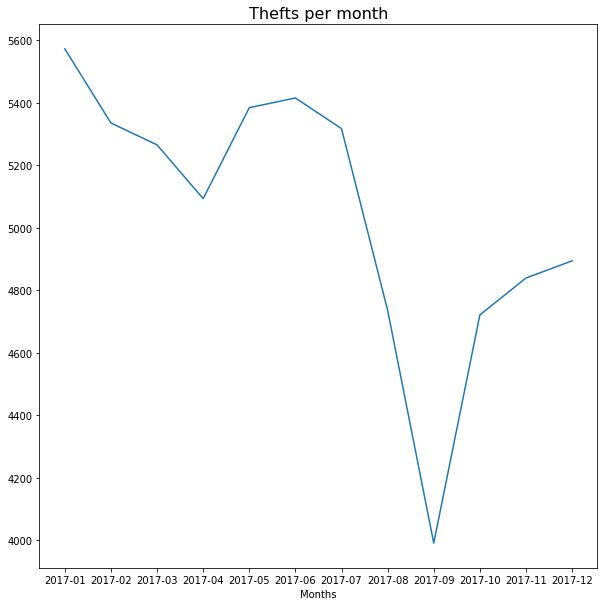

In [143]:
plt.title('Thefts per month', fontsize=16)
plt.xlabel('Months')
plt.plot(theft_month['year_month'],theft_month['Offense_Type'], label = 'Total In Month')

The obervation is consistent with other years, showing that theft happens more often in June and January. 

**Map**

In [70]:
theft = theft_2017.copy()

In [71]:
theft_map = theft.groupby(["X","Y"], as_index=False)[['Num_Offenses']].count()

In [72]:
theft_map.head()

,X,Y,Num_Offenses
0,-95.768696,29.701949,1
1,-95.763553,29.793114,1
2,-95.757770,29.790414,1
3,-95.751808,29.801024,1
4,-95.751797,29.794499,1


In [75]:
# theft_map = theft[['X','Y', 'count']].groupby(['X','Y']).sum().sort_values('count', ascending=False)

In [73]:
from folium.plugins.marker_cluster import MarkerCluster

In [74]:
houston_clu_map = folium.Map(location=[29.7174,-95.4018], zoom_start=12,
                   tiles='Cartodb Positron')

In [76]:
folium.Marker([29.7174,-95.4018], 
              popup='Rice University',
              icon=folium.Icon(color='blue',icon='university', prefix='fa') 
             ).add_to(houston_clu_map)

In [77]:
point_cluster = MarkerCluster().add_to(houston_clu_map)

for i, zone in theft_map.iterrows():
    folium.Marker([zone.Y, zone.X], popup="Theft: {}".format(zone.Num_Offenses)).add_to(point_cluster)

In [78]:
houston_clu_map.save("map.html")

In [79]:
houston_clu_map

## Conclusion

From the data analysis, we can tell that Houton area has plenty of crimes, especially in theft. But from 2010 to 2017, the crime rate decreases sharply. The working ours, the street type and the police division all shows the declining trend, especially in theft. 

From the map, we can tell that crime happens a lot in the northern and western part, which is consistent with the police division distributiion. As for my school, it is safe in the surrounding area, but theft happens most in the upper parts and western parts. On the other hand, he theft area also means that the rich area. For personl insight, when I am considering renting house to live off campus, I would still choose the north and western part, but in a place where the price is cheaper and the crime rate is lower. The southwest and northeast 

Reference: https://www.kaggle.com/uds5501/chicago-crime-mapping/notebook